این فایل به منظور انجام یک تحلیل کلی و نشان دادن نمودارهای مروبط به داده اماده گردیده است

In [20]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import math

In [21]:
# importing bokeh plots, palettes and models for interactive plotting

from bokeh.plotting import figure, show, output_file, output_notebook
from bokeh.palettes import Spectral11, colorblind, Inferno, BuGn, brewer
# from bokeh.models import HoverTool, value, LabelSet, Legend, ColumnDataSource
from bokeh.models import LinearColorMapper,BasicTicker, PrintfTickFormatter, ColorBar

In [22]:
df= pd.read_csv('/home/zahramirzaei/Downloads/SnappTrip_BA_Task.csv')

In [23]:
def preprocess(df):
    df['Flightdate'] = pd.to_datetime(df['Flightdate'])
    df['Flightdate']= df['Flightdate'].dt.date
    df=df[['Flightdate', 'Tickets']]
    return df

In [24]:
df=preprocess(df)

In [25]:
df.head()

,Flightdate,Tickets
0,2021-04-30,3
1,2021-05-02,3
2,2021-05-02,3
3,2021-05-03,3
4,2021-05-01,6


In [26]:
df.isnull().any()

Flightdate    False
Tickets       False
dtype: bool

In [32]:
# changing the format of the Date-time to extract them

df['Flightdate'] = pd.to_datetime(df.Flightdate) 
df['month']= df['Flightdate'].dt.month
df['year']= df['Flightdate'].dt.year
df['day']= df['Flightdate'].dt.day

In [33]:
df

,Flightdate,Tickets,month,year,day
0,2021-04-30,3,4,2021,30
1,2021-05-02,3,5,2021,2
2,2021-05-02,3,5,2021,2
3,2021-05-03,3,5,2021,3
4,2021-05-01,6,5,2021,1
...,...,...,...,...,...
1308660,2023-05-07,3,5,2023,7
1308661,2023-05-09,3,5,2023,9
1308662,2023-05-11,3,5,2023,11
1308663,2023-05-12,3,5,2023,12


In [34]:
df['year'].value_counts()

2022    722910
2021    367566
2023    218189
Name: year, dtype: int64

<AxesSubplot: >

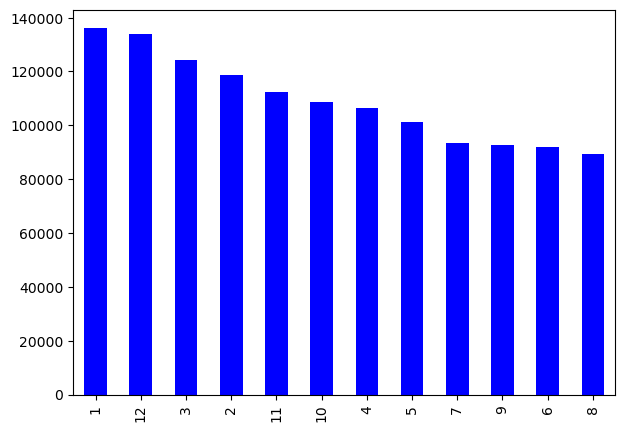

In [35]:
df['month'].value_counts().plot.bar(color = 'blue', figsize = (7, 5))

<AxesSubplot: >

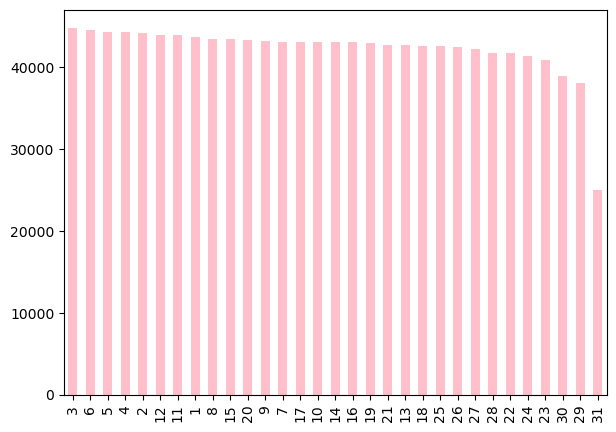

In [36]:
df['day'].value_counts().plot.bar(color = 'pink', figsize = (7, 5))

In [37]:
df['DayofWeek'] = df['Flightdate'].dt.dayofweek
df.head()


,Flightdate,Tickets,month,year,day,DayofWeek
0,2021-04-30,3,4,2021,30,4
1,2021-05-02,3,5,2021,2,6
2,2021-05-02,3,5,2021,2,6
3,2021-05-03,3,5,2021,3,0
4,2021-05-01,6,5,2021,1,5


<AxesSubplot: >

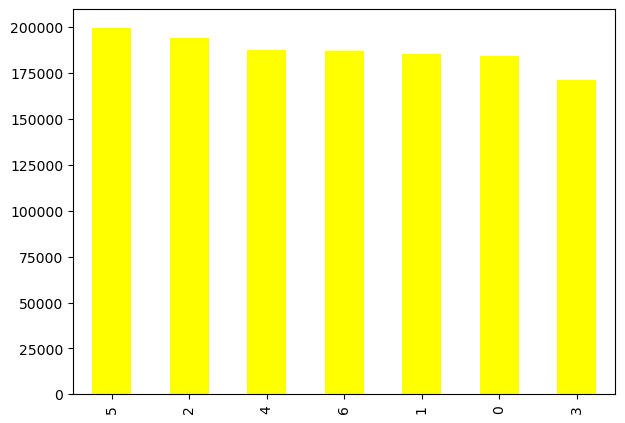

In [38]:
df['DayofWeek'].value_counts().plot.bar(color = 'yellow',figsize = (7, 5))

In [39]:
# lets create a weekend column here weekend means 4 and 5 corresponding to saturday and sunday

def applyer(row):
    if row.dayofweek == 4 or row.dayofweek == 5:
        
        return 1
    else:
        return 0

In [40]:
df['weekend'] = df['Flightdate'].apply(applyer)
df.head(4)

,Flightdate,Tickets,month,year,day,DayofWeek,weekend
0,2021-04-30,3,4,2021,30,4,1
1,2021-05-02,3,5,2021,2,6,0
2,2021-05-02,3,5,2021,2,6,0
3,2021-05-03,3,5,2021,3,0,0


In [41]:
df.tail(4)

,Flightdate,Tickets,month,year,day,DayofWeek,weekend
1308661,2023-05-09,3,5,2023,9,1,0
1308662,2023-05-11,3,5,2023,11,3,0
1308663,2023-05-12,3,5,2023,12,4,1
1308664,2023-07-05,3,7,2023,5,2,0


<AxesSubplot: >

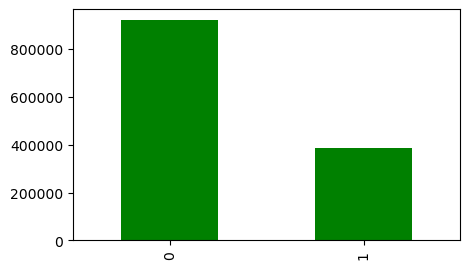

In [42]:
df['weekend'].value_counts().plot.bar(color = 'green', figsize = (5, 3))

In [43]:
# plotting a time series for the datetime and ticket count

TOOLS = "save, pan, box_zoom, reset, wheel_zoom, tap"

output_file("line_chart_ts.html", title = 'Line_chart')
x = df.Flightdate
y = df.Tickets

output_notebook()
p = figure(tools = TOOLS, title="tickets", y_axis_type="linear", x_axis_type='datetime')
p.line(x, y)
show(p)




Loading BokehJS ...

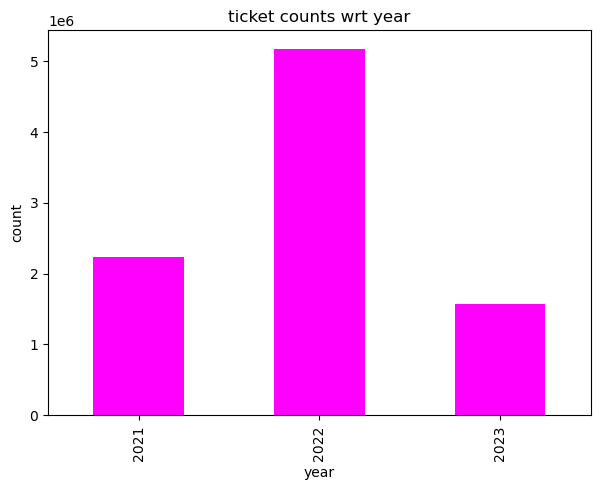

In [44]:
# plotting comparison of year with respect to ticket counts

df.groupby('year')['Tickets'].sum().plot.bar(color = 'magenta', figsize = (7, 5))
plt.title('ticket counts wrt year')
plt.ylabel('count')
plt.show()

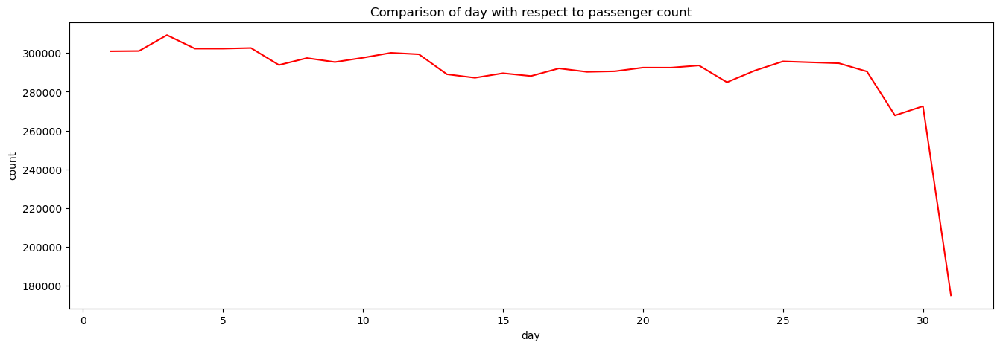

In [45]:
# plotting comparison of day with respect to ticket counts

df.groupby('day')['Tickets'].sum().plot.line(color = 'red', figsize = (16, 5))
plt.title('Comparison of day with respect to passenger count')
plt.ylabel('count')
plt.show()

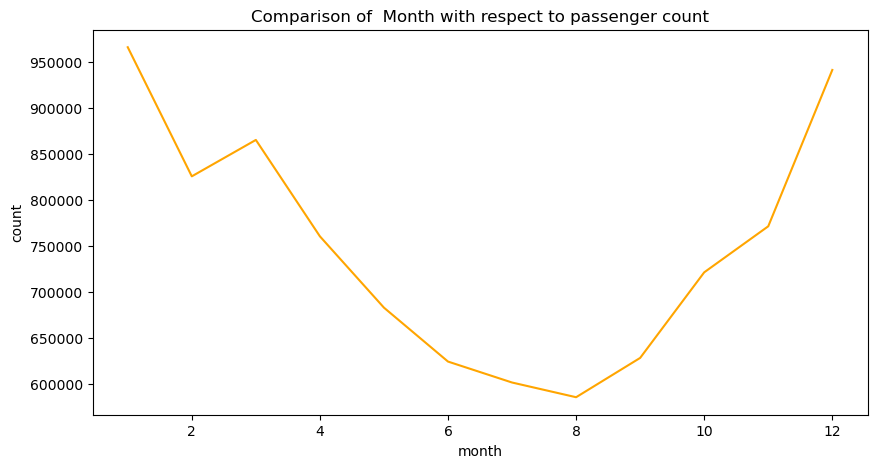

In [46]:
# plotting comparison of month with respect to count of tickets

df.groupby('month')['Tickets'].sum().plot.line(color = 'orange', figsize = (10, 5))
plt.title('Comparison of  Month with respect to passenger count')
plt.ylabel('count')
plt.show()

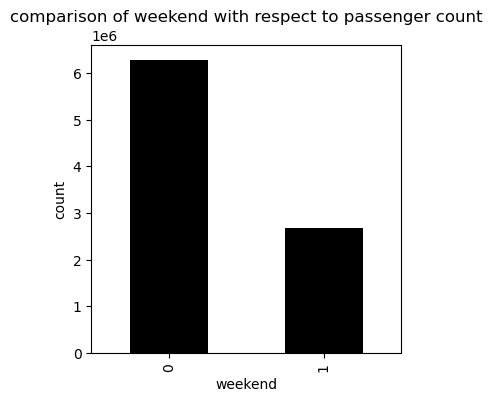

In [47]:
#plotting comparison of weekend with respect to ticket count

df.groupby('weekend')['Tickets'].sum().plot.bar(color = 'black', figsize = (4, 4))
plt.title('comparison of weekend with respect to passenger count')
plt.ylabel('count')
plt.show()

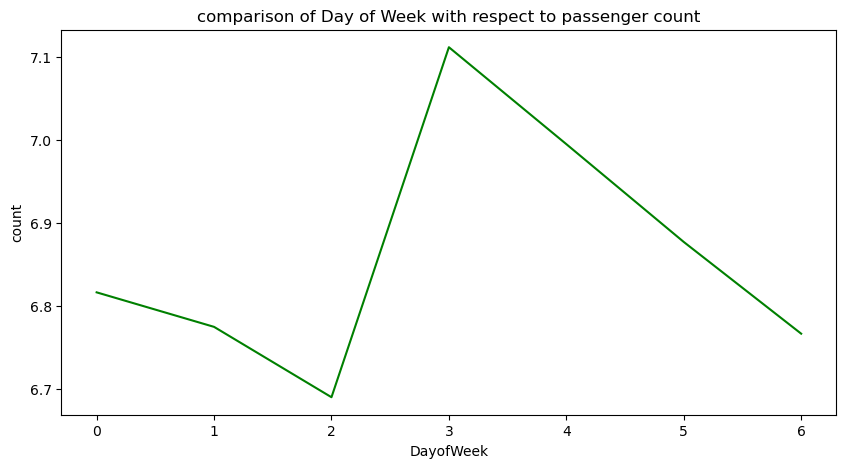

In [48]:
#plotting comparison of day of week with respect to ticket count

df.groupby('DayofWeek')['Tickets'].mean().plot.line(color = 'green', figsize = (10, 5))
plt.title('comparison of Day of Week with respect to passenger count')
plt.ylabel('count')
plt.show()

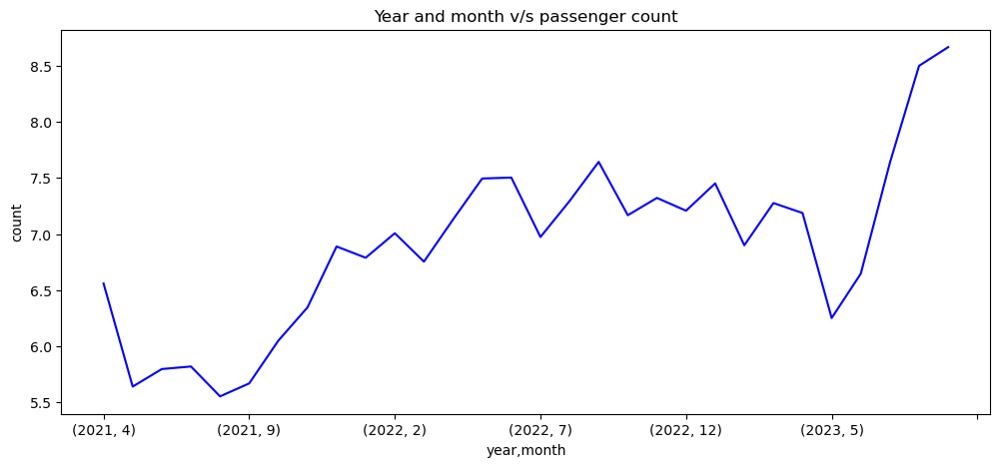

In [49]:
# comparison of year and month with respect to ticket count

df.groupby(['year','month'])['Tickets'].mean().plot.line(color = 'blue', figsize = (12, 5))
plt.title('Year and month v/s passenger count')
plt.ylabel('count')
plt.show()